# Package import and dataset loading

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [ ]:
data_path = "../data/"
lap = pd.read_csv(data_path + "laptop_final.csv")

# Missing value analysis

In [23]:
# Missing values
missing = lap.isnull().sum()
missing = missing[missing > 0]
missing = missing.sort_values(ascending=False)
missing = missing / len(lap) * 100
missing = missing.round(2)
missing = missing.to_frame()
missing = missing.rename(columns={0: 'Missing (%)'})
missing['Number of missing'] = lap.isnull().sum()
missing

,Missing (%),Number of missing
Cost,74.64,215838
Ethernet LAN,27.72,80172
Play Score,20.28,58640
Total Score,20.28,58640
Portability Score,20.28,58640
Display Score,20.28,58640
Work Score,20.28,58640
RAM Type,12.98,37543
GPU: Base Clock,9.46,27367
GPU: Architecture,6.75,19524


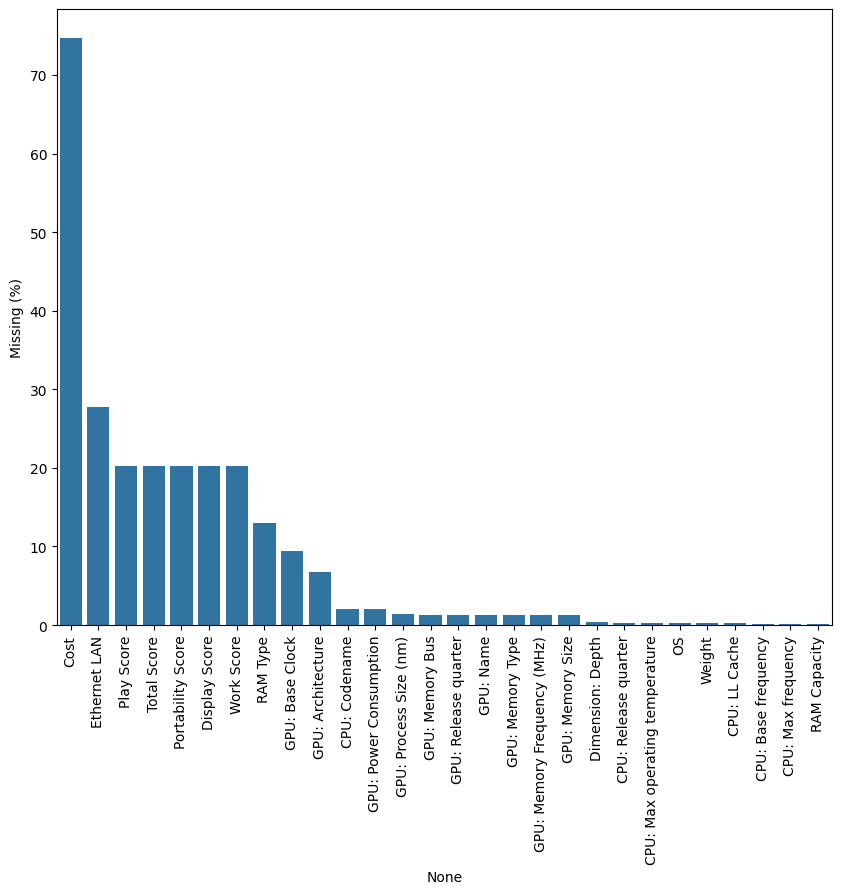

In [24]:
# Draw a bar plot of missing values
plt.figure(figsize=(10, 8))
sns.barplot(x=missing.index, y='Missing (%)', data=missing)
plt.xticks(rotation=90)
plt.show()

There are numerous missing values in the Cost column, which presents a challenge. However, only 20% of the score data is missing, and the missing values are consistent across all scores. This means that if a row contains a value for one score, it will have values for all other scores as well. This consistency makes predicting scores more manageable. Among the other columns, only Ethernet LAN and RAM Type stand out with a relatively high proportion of missing values (over 10%).

# Unique value analysis

In [25]:
# Unique values
unique = lap.nunique()
unique = unique.sort_values(ascending=False)
unique = unique.to_frame()
unique = unique.rename(columns={0: 'Unique values'})
unique

,Unique values
link,289171
Cost,6864
name,4182
GPU: Name,338
CPU: Name,251
...,...
Body material: matte,2
Body material: plastic,2
Body material: magnesium-lithium alloy,2
Body material: carbon,2


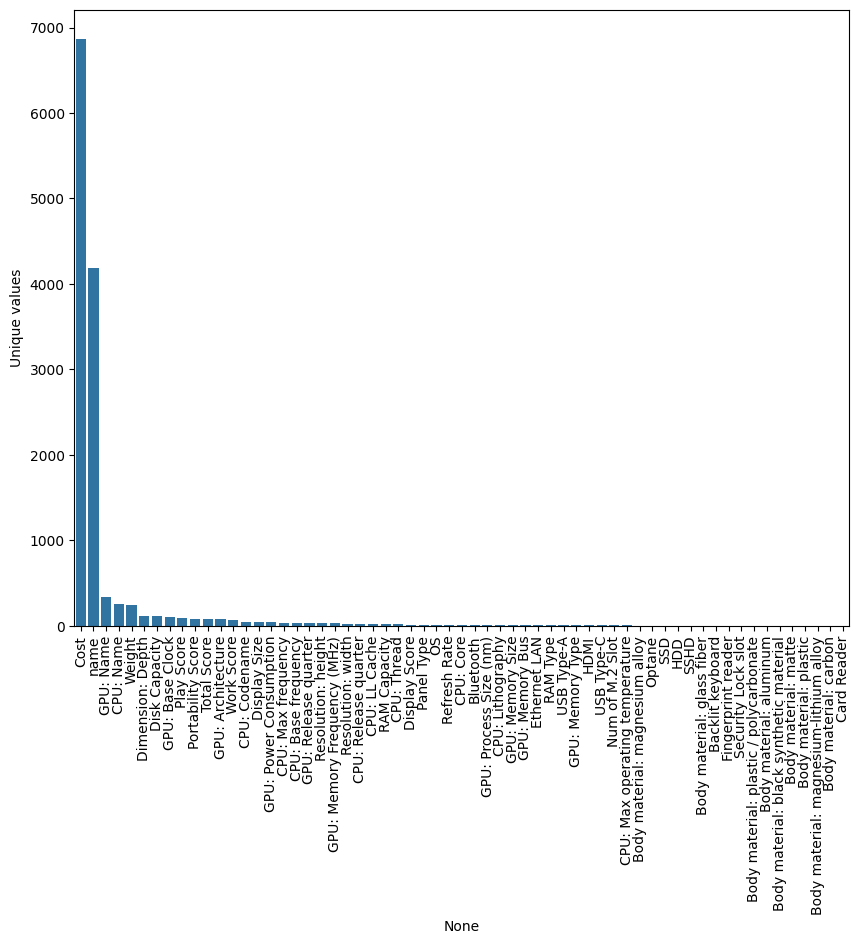

In [26]:
# Draw a bar plot of unique values excluding the 'link' column
plt.figure(figsize=(10, 8))
sns.barplot(x=unique.index[1:], y='Unique values', data=unique[1:])
plt.xticks(rotation=90)
plt.show()

Excluding the Cost and laptop name columns, as well as the CPU and GPU, it is evident that most of the remaining columns have limited unique values, often just a few dozen. This is concerning given the dataset contains nearly 300,000 rows, as such a low variety of values could indicate redundancy.

In [27]:
unique_rows = lap.drop(['link', 'Cost'], axis=1).duplicated().sum()
len(lap) - unique_rows

164377

After removing the Link and Cost columns, only 164,377 rows are unique out of the original 300,000. This highlights the high level of noise in the dataset, which could impact the effectiveness of any downstream analysis or modeling efforts.

# Brand and Model related analysis 

In [28]:
lap['name'] = lap['name'].str.lower()
name = lap["name"]

lap['brand'] = name.str.split().str[0]
lap['model'] = name.str.split().str[1]

In [29]:
fig = px.sunburst(lap, path=['brand', 'model'], title='Laptop Brands and Models', width=500, height=500)
fig.show()

The market is dominated by 6 big laptop brands, namely HP, Lenovo, ASUS, MSI, Dell and Acer. The remaining 10% is spread between nearly 100 brands

In [30]:
top100 = lap['Cost'].nlargest(100)
top100 = lap.loc[top100.index]
fig = px.sunburst(top100, path=['brand', 'model'], title='Top 100 Most Expensive Laptops by brand and model', height=500, width=500)
fig.show()

The highest price range is dominated by gaming laptops (rog, tuf, predator, omen, raider) as well as premium grade creative laptop (proart)

In [31]:
bot100 = lap['Cost'].nsmallest(100)
bot100 = lap.loc[bot100.index]
fig = px.sunburst(bot100, path=['brand', 'model'], title='Top 100 Cheapest Laptops by brand and model', height=500, width=500)
fig.show()

The lowest price range in contrast is completely dominated by Chromebooks and cheap work laptops

# Cost and Scores analysis

NOTE: If you run all this notebook, you should go back, uncomment the cost outliers dropping and rerun the codes to see the actual data visualization without outliers. The results saved in this notebook are the results without outliers (suppose no one change this notebook any further)

In [ ]:
# Drop cost outliers

# lap = lap[lap['Cost'] < 10000]

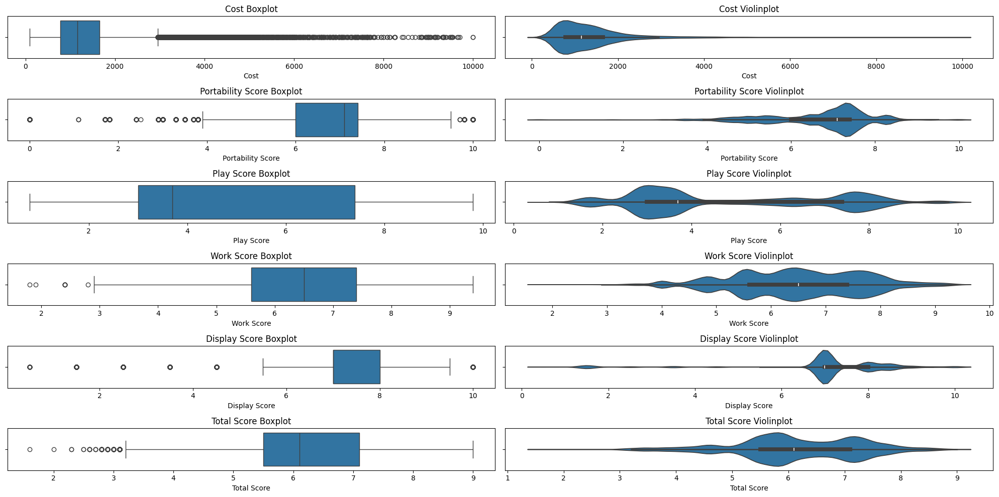

In [42]:
res = ['Cost', 'Portability Score', 'Play Score', 'Work Score', 'Display Score', 'Total Score']

fig, ax = plt.subplots(len(res), 2, figsize=(20, 10))
for col in res:
    sns.boxplot(x=col, data=lap, ax=ax[res.index(col), 0])
    sns.violinplot(x=col, data=lap, ax=ax[res.index(col), 1])
    ax[res.index(col), 0].set_title(f'{col} Boxplot')
    ax[res.index(col), 1].set_title(f'{col} Violinplot')

plt.tight_layout()

The cost has very extreme outlier, after further analysis in data wrangler, we come to the conclusion that all row with cost larger than 10000 are outliers.

In [43]:
fig = px.scatter_matrix(lap, dimensions=res, title='Laptop Scores and Cost')
fig.update_traces(diagonal_visible=False)
fig.update_layout(width=1000, height=1000)
fig.show()

The Total Score and Cost show a strong correlation with the Work Score and Play Score, indicating that laptops designed for productivity and gaming tend to have higher overall scores and costs. In contrast, the Portability Score has little to no correlation with either the Total Score or Cost, suggesting that portability is not a significant factor influencing these metrics. The Display Score exhibits a relatively weak correlation, indicating that while display quality contributes to the overall score and cost, its impact is less pronounced compared to work and play performance.

# Other observations

In [35]:
os = lap['OS'].value_counts()
fig = px.pie(os, values=os, names=os.index, title='Laptop OS Distribution', width=500, height=500)
fig.show()

60% of laptops come with windows 11 preinstalled, 38% with windows 10, and the remaining 2% are shared between other OSes.

In [36]:
lap['CPU: Name'] = lap['CPU: Name'].str.replace('-', ' ')
lap['GPU: Name'] = lap['GPU: Name'].str.replace('-', ' ')
lap['CPU: Model'] = lap['CPU: Name'].str.split().str[0]
lap['GPU: Model'] = lap['GPU: Name'].str.split().str[0]

In [37]:
# Pie chart of number of CPU and GPU models
cpu = lap['CPU: Model'].value_counts()
gpu = lap['GPU: Model'].value_counts()

fig = px.pie(cpu, values=cpu, names=cpu.index, title='Laptop CPU Model Distribution', width=500, height=500)
fig.show()

fig = px.pie(gpu, values=gpu, names=gpu.index, title='Laptop GPU Model Distribution', width=500, height=500)
fig.show()

The CPU market is dominated by Intel Core and AMD Ryzen processors, while Intel Celeron chips account for 1.7% of the market, and the remaining 1% is shared among Apple M chips and various older processors.
In contrast, the GPU market is more evenly distributed among three major players: NVIDIA GeForce, Intel Iris, and AMD Radeon GPUs, reflecting a balanced competition in this segment.

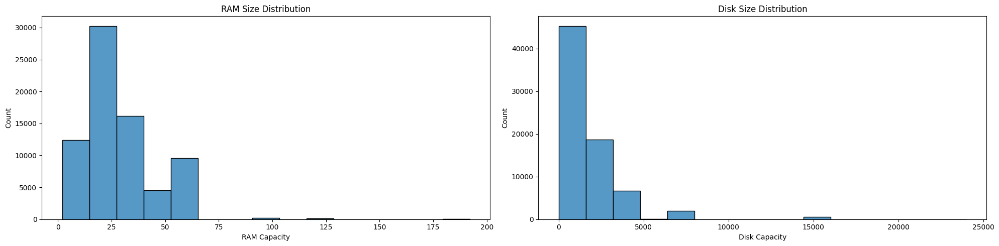

In [44]:
# RAM and Disk size distribution
fig, ax = plt.subplots(1, 2, figsize=(20, 5))
sns.histplot(lap['RAM Capacity'], bins=15, ax=ax[0])
ax[0].set_title('RAM Size Distribution')
sns.histplot(lap['Disk Capacity'], bins=15, ax=ax[1])
ax[1].set_title('Disk Size Distribution')

plt.tight_layout()

Disk Size has extreme outliers, after analysis in data wrangler, we come to the conclusion that any laptops having disk size larger than 24000 GB are outliers.
Incidentally, removing Cost outliers also remove the Disk Size outliers, this suggests that there are some rows that have completely data that need to be removed.

Both graphs indicate a standard trend in the laptop market, where low- and mid-range configurations (e.g., 8GB-16GB RAM and 256GB-1TB storage) dominate. Higher-end configurations (e.g., large RAM or disk sizes) are much less common, likely due to cost or very specific use cases (server laptop, premium grade work and gaming laptop, ...).

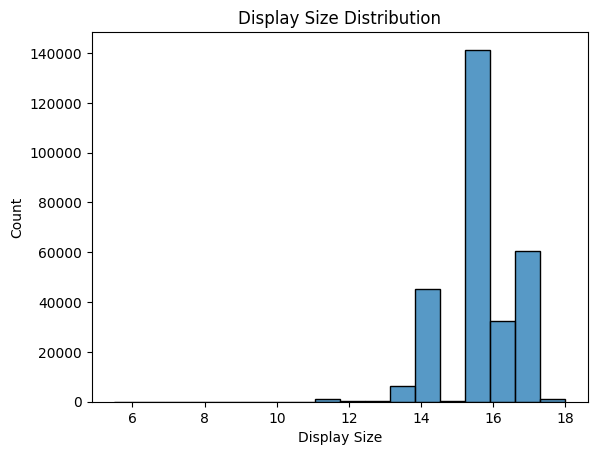

In [39]:
# Display size distribution
sns.histplot(lap['Display Size'], bins=18)
plt.title('Display Size Distribution')
plt.show()

The vast majority of laptops feature screen sizes of 14, 16, or 17 inches, which dominate the market. Other screen sizes are far less common, collectively accounting for only about 3,000 laptops. This indicates a strong preference for standard screen sizes, likely due to their balance between usability and portability.

In [40]:
# Scatter plot of resolution width and height
fig = px.scatter(lap, x='Resolution: width', y='Resolution: height', title='Resolution Width and Height')
fig.show()

Screen ratio follow a strict ratio of approximately 16:9, with 2 exceptions being the ultrawide and ultrahigh screens.